In [1]:
!pip install plotly missingno

In [2]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')
%matplotlib inline

import plotly as py
import plotly.graph_objs as go

In [3]:
data= pd.read_csv('raw-data.csv')

In [4]:
data.head()

,date,county_fips,county_name,state_fips,state_name,covid_19_confirmed_cases,covid_19_deaths,social_distancing_total_grade,social_distancing_visitation_grade,social_distancing_encounters_grade,...,age_45_49,age_50_54,age_55_59,age_60_64,age_65_69,age_70_74,age_75_79,age_80_84,age_85_or_higher,immigrant_student_ratio
0,01/22/20,1001,Autauga County,1,Alabama,0.0,0.0,NaN,NaN,NaN,...,8,7,6,5,4,3,2,1,1,0.0
1,01/23/20,1001,Autauga County,1,Alabama,0.0,0.0,NaN,NaN,NaN,...,8,7,6,5,4,3,2,1,1,0.0
2,01/24/20,1001,Autauga County,1,Alabama,0.0,0.0,NaN,NaN,NaN,...,8,7,6,5,4,3,2,1,1,0.0
3,01/25/20,1001,Autauga County,1,Alabama,0.0,0.0,NaN,NaN,NaN,...,8,7,6,5,4,3,2,1,1,0.0
4,01/26/20,1001,Autauga County,1,Alabama,0.0,0.0,NaN,NaN,NaN,...,8,7,6,5,4,3,2,1,1,0.0


In [5]:
data.tail()

,date,county_fips,county_name,state_fips,state_name,covid_19_confirmed_cases,covid_19_deaths,social_distancing_total_grade,social_distancing_visitation_grade,social_distancing_encounters_grade,...,age_45_49,age_50_54,age_55_59,age_60_64,age_65_69,age_70_74,age_75_79,age_80_84,age_85_or_higher,immigrant_student_ratio
750933,09/12/20,56045,Weston County,56,Wyoming,2.0,0.0,C,NaN,A,...,8,9,8,6,4,4,3,2,3,0.0
750934,09/13/20,56045,Weston County,56,Wyoming,0.0,0.0,C,NaN,A,...,8,9,8,6,4,4,3,2,3,0.0
750935,09/14/20,56045,Weston County,56,Wyoming,0.0,0.0,C,NaN,A,...,8,9,8,6,4,4,3,2,3,0.0
750936,09/15/20,56045,Weston County,56,Wyoming,0.0,0.0,B-,NaN,A,...,8,9,8,6,4,4,3,2,3,0.0
750937,09/16/20,56045,Weston County,56,Wyoming,0.0,0.0,C,NaN,A,...,8,9,8,6,4,4,3,2,3,0.0


In [6]:
data.shape

(750938, 58)

In [7]:
data.dtypes

date                                        object
county_fips                                  int64
county_name                                 object
state_fips                                   int64
state_name                                  object
covid_19_confirmed_cases                   float64
covid_19_deaths                            float64
social_distancing_total_grade               object
social_distancing_visitation_grade          object
social_distancing_encounters_grade          object
social_distancing_travel_distance_grade     object
daily_state_test                           float64
precipitation                              float64
temperature                                float64
total_population                             int64
female_percent                             float64
area                                       float64
population_density                         float64
latitude                                   float64
longitude                      

# Visualizing missing data

In [8]:
data.isna().sum()

date                                            0
county_fips                                     0
county_name                                     0
state_fips                                      0
state_name                                      0
covid_19_confirmed_cases                        0
covid_19_deaths                                 0
social_distancing_total_grade              122020
social_distancing_visitation_grade         324202
social_distancing_encounters_grade         122020
social_distancing_travel_distance_grade    122020
daily_state_test                           132248
precipitation                              256910
temperature                                352950
total_population                                0
female_percent                                  0
area                                            0
population_density                              0
latitude                                        0
longitude                                       0


<AxesSubplot:>

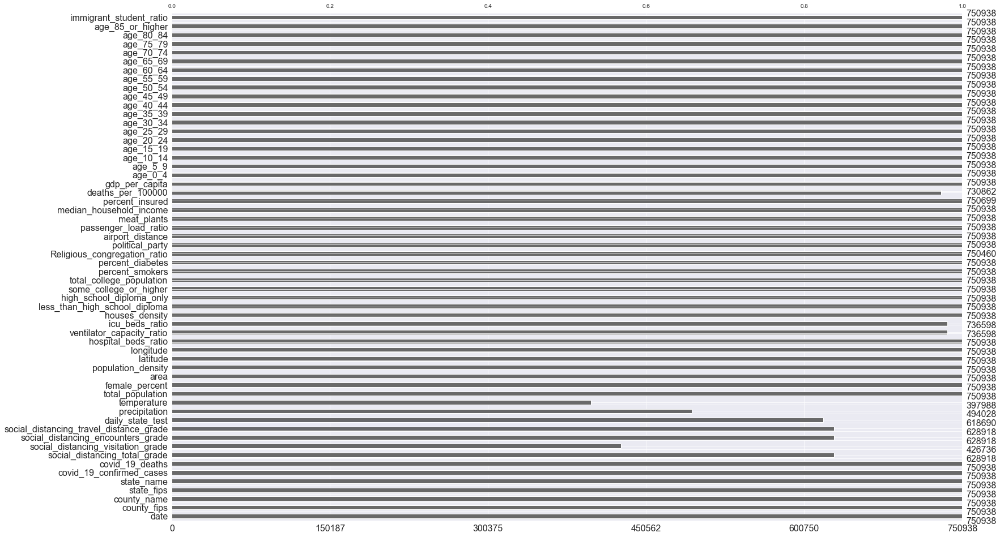

In [9]:
import missingno as msno
msno.bar(data)

In [10]:
data.columns

Index(['date', 'county_fips', 'county_name', 'state_fips', 'state_name',
       'covid_19_confirmed_cases', 'covid_19_deaths',
       'social_distancing_total_grade', 'social_distancing_visitation_grade',
       'social_distancing_encounters_grade',
       'social_distancing_travel_distance_grade', 'daily_state_test',
       'precipitation', 'temperature', 'total_population', 'female_percent',
       'area', 'population_density', 'latitude', 'longitude',
       'hospital_beds_ratio', 'ventilator_capacity_ratio', 'icu_beds_ratio',
       'houses_density', 'less_than_high_school_diploma',
       'high_school_diploma_only', 'some_college_or_higher',
       'total_college_population', 'percent_smokers', 'percent_diabetes',
       'Religious_congregation_ratio', 'political_party', 'airport_distance',
       'passenger_load_ratio', 'meat_plants', 'median_household_income',
       'percent_insured', 'deaths_per_100000', 'gdp_per_capita', 'age_0_4',
       'age_5_9', 'age_10_14', 'age_15_19', 

In [11]:
data=data.drop(['social_distancing_total_grade', 'social_distancing_visitation_grade',
       'social_distancing_encounters_grade',
       'social_distancing_travel_distance_grade','precipitation','temperature',
       'ventilator_capacity_ratio','county_fips',
       'state_fips'], axis = 1)

We are repacing Na values with the 0 because in the starting of covid there is no such test to detect the covid the united states. 

In [12]:
data.daily_state_test = data.daily_state_test.fillna(0)

In [13]:
data.deaths_per_100000= data.deaths_per_100000.fillna(0)

data.icu_beds_ratio=data.icu_beds_ratio.fillna(0)

In [14]:
data=data.bfill(axis ='rows')

In [15]:
data.isna().sum()

date                             0
county_name                      0
state_name                       0
covid_19_confirmed_cases         0
covid_19_deaths                  0
daily_state_test                 0
total_population                 0
female_percent                   0
area                             0
population_density               0
latitude                         0
longitude                        0
hospital_beds_ratio              0
icu_beds_ratio                   0
houses_density                   0
less_than_high_school_diploma    0
high_school_diploma_only         0
some_college_or_higher           0
total_college_population         0
percent_smokers                  0
percent_diabetes                 0
Religious_congregation_ratio     0
political_party                  0
airport_distance                 0
passenger_load_ratio             0
meat_plants                      0
median_household_income          0
percent_insured                  0
deaths_per_100000   

In [16]:
data.head()

,date,county_name,state_name,covid_19_confirmed_cases,covid_19_deaths,daily_state_test,total_population,female_percent,area,population_density,...,age_45_49,age_50_54,age_55_59,age_60_64,age_65_69,age_70_74,age_75_79,age_80_84,age_85_or_higher,immigrant_student_ratio
0,01/22/20,Autauga County,Alabama,0.0,0.0,0.0,55601,0.514487,594.44,93.535092,...,8,7,6,5,4,3,2,1,1,0.0
1,01/23/20,Autauga County,Alabama,0.0,0.0,0.0,55601,0.514487,594.44,93.535092,...,8,7,6,5,4,3,2,1,1,0.0
2,01/24/20,Autauga County,Alabama,0.0,0.0,0.0,55601,0.514487,594.44,93.535092,...,8,7,6,5,4,3,2,1,1,0.0
3,01/25/20,Autauga County,Alabama,0.0,0.0,0.0,55601,0.514487,594.44,93.535092,...,8,7,6,5,4,3,2,1,1,0.0
4,01/26/20,Autauga County,Alabama,0.0,0.0,0.0,55601,0.514487,594.44,93.535092,...,8,7,6,5,4,3,2,1,1,0.0


In [17]:
type_of_wave= []

for i in data['date']:
  if (i >= '03-15-20') & (i <= '05-30-20'):
    type_of_wave.append("first_wave")

  elif (i >= '06-15-20') & (i <= '07-31-30'):
    type_of_wave.append("second_wave")

  else:
    type_of_wave.append("No wave")

In [18]:
data['type_of_wave'] = type_of_wave

In [19]:
data.tail()

,date,county_name,state_name,covid_19_confirmed_cases,covid_19_deaths,daily_state_test,total_population,female_percent,area,population_density,...,age_50_54,age_55_59,age_60_64,age_65_69,age_70_74,age_75_79,age_80_84,age_85_or_higher,immigrant_student_ratio,type_of_wave
750933,09/12/20,Weston County,Wyoming,2.0,0.0,33.0,6967,0.470504,2398.09,2.905229,...,9,8,6,4,4,3,2,3,0.0,No wave
750934,09/13/20,Weston County,Wyoming,0.0,0.0,49.0,6967,0.470504,2398.09,2.905229,...,9,8,6,4,4,3,2,3,0.0,No wave
750935,09/14/20,Weston County,Wyoming,0.0,0.0,2569.0,6967,0.470504,2398.09,2.905229,...,9,8,6,4,4,3,2,3,0.0,No wave
750936,09/15/20,Weston County,Wyoming,0.0,0.0,739.0,6967,0.470504,2398.09,2.905229,...,9,8,6,4,4,3,2,3,0.0,No wave
750937,09/16/20,Weston County,Wyoming,0.0,0.0,224.0,6967,0.470504,2398.09,2.905229,...,9,8,6,4,4,3,2,3,0.0,No wave


In [20]:
data.shape

(750938, 50)

In [21]:
dataset=data.copy()

In [22]:
data['date'] = pd.to_datetime(data['date'])  

# Number of Cases and deaths in Top 10 State




In [23]:
covid_cases = data.groupby('state_name')['covid_19_confirmed_cases'].sum()
covid_cases = covid_cases.sort_values(ascending=False)
most_affected_countries = covid_cases[1:11].index

cases = covid_cases[1:11].values 

total_deaths = data.groupby('state_name')['covid_19_deaths'].sum()
deaths = total_deaths[most_affected_countries].values # Number of Deaths in Top 10 Countries


cases_deaths_data = pd.DataFrame({'State': most_affected_countries, 'Total Cases': cases, 'Total Deaths': deaths})
print(cases_deaths_data)

            State  Total Cases  Total Deaths
0           Texas     683863.0       14469.0
1         Florida     669635.0       12939.0
2        New York     446366.0       32637.0
3         Georgia     279928.0        6272.0
4        Illinois     266093.0        8367.0
5         Arizona     209904.0        5370.0
6      New Jersey     197472.0       16053.0
7  North Carolina     188017.0        3147.0
8       Tennessee     171620.0        2118.0
9       Louisiana     158622.0        5126.0


Text(0.5, 1.0, 'Number of Cases in Top 10 States')

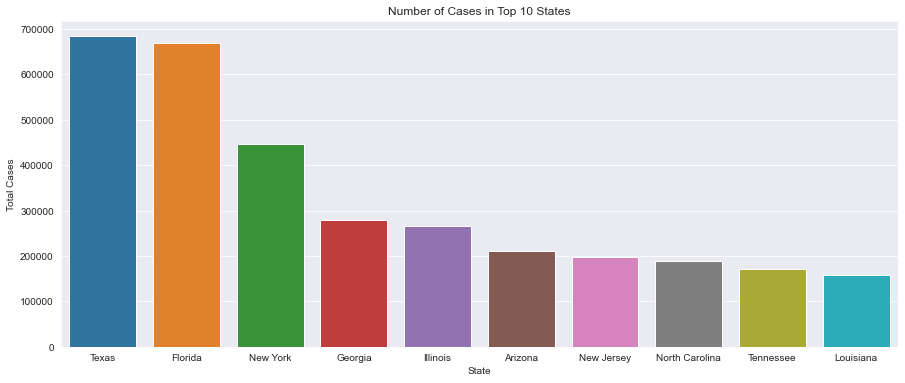

In [24]:
plt.figure(figsize=(15,6))
sns.barplot(x="State", y="Total Cases", data=cases_deaths_data)
plt.title("Number of Cases in Top 10 States")

In [25]:
data['covid_19_confirmed_cases'].describe()

count    750938.000000
mean          8.713288
std          61.081717
min       -1834.000000
25%           0.000000
50%           0.000000
75%           3.000000
max        9589.000000
Name: covid_19_confirmed_cases, dtype: float64

<AxesSubplot:xlabel='date', ylabel='covid_19_confirmed_cases'>

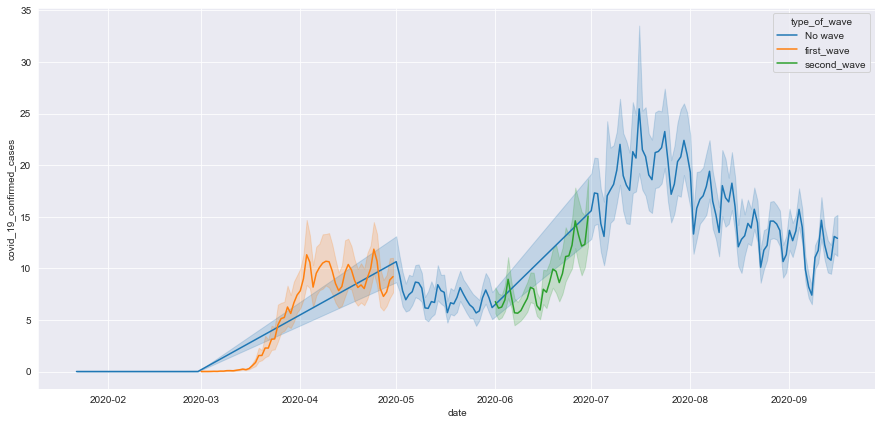

In [26]:
plt.figure(figsize=(15,7))
sns.lineplot(x="date", y="covid_19_confirmed_cases", hue="type_of_wave", data=data)

# Analysing the Covid 19 deaths in each wave and which states most deaths happen

In [27]:
data['covid_19_deaths'].describe()

count    750938.000000
mean          0.259234
std           3.115823
min        -122.000000
25%           0.000000
50%           0.000000
75%           0.000000
max         707.000000
Name: covid_19_deaths, dtype: float64

Text(0.5, 1.0, 'Deaths in each wave')

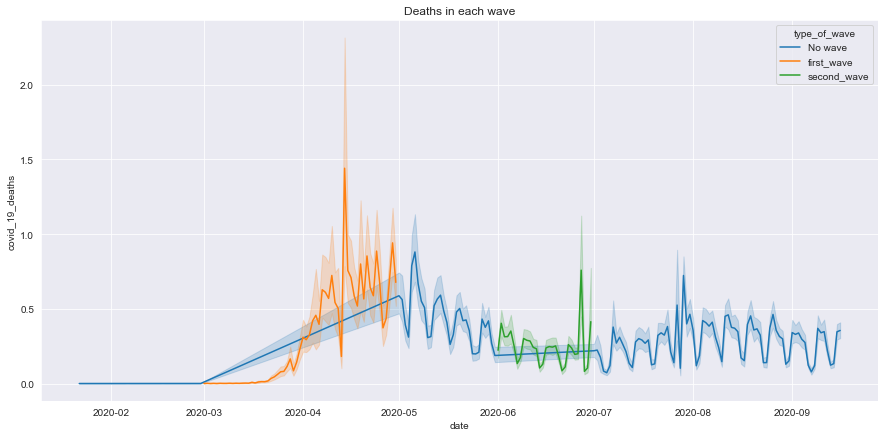

In [28]:
plt.figure(figsize=(15,7))
sns.lineplot(x="date", y="covid_19_deaths", hue="type_of_wave", data=data)
plt.title("Deaths in each wave")

Text(0.5, 1.0, 'Number of Deaths in Top 10 States')

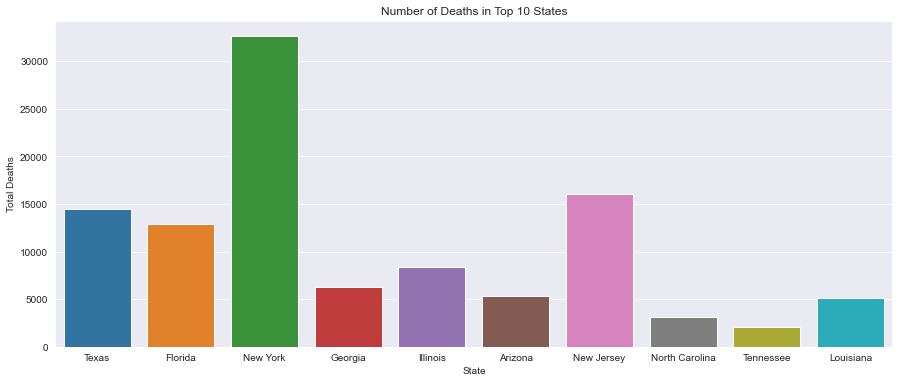

In [29]:
plt.figure(figsize=(15,6))
sns.barplot(x="State", y="Total Deaths", data=cases_deaths_data)
plt.title("Number of Deaths in Top 10 States")

# Analysis on the total test in each state

In [30]:
data['daily_state_test'].describe()

count    750938.000000
mean       9419.783533
std       18002.425887
min     -336892.000000
25%          28.000000
50%        3500.000000
75%       11616.000000
max      187926.000000
Name: daily_state_test, dtype: float64

Text(0.5, 1.0, 'daily_state_test in each wave')

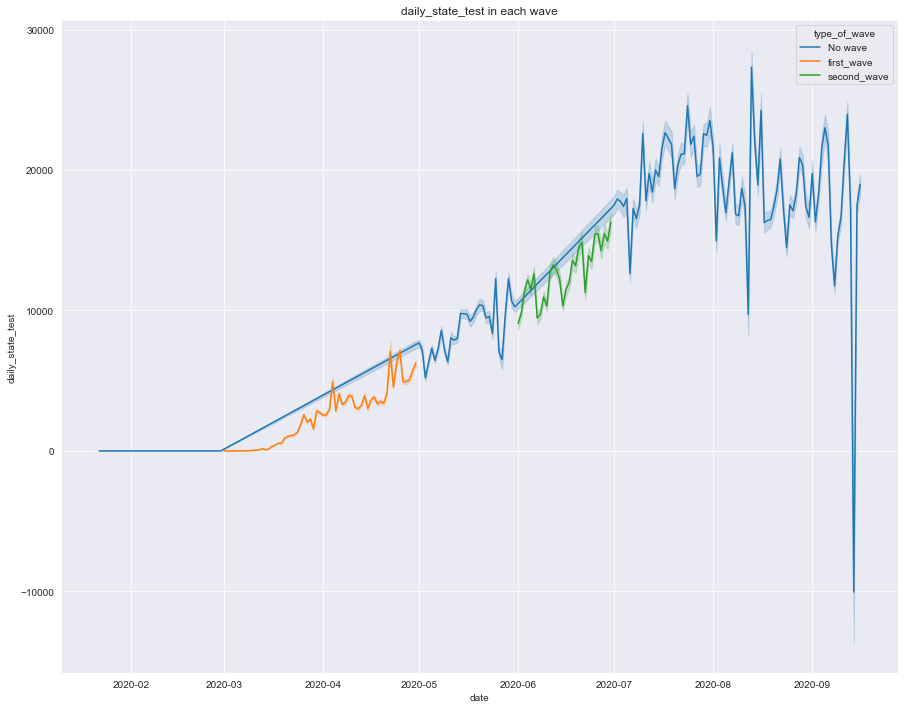

In [31]:
plt.figure(figsize=(15,12))
sns.lineplot(x="date", y="daily_state_test", hue="type_of_wave", data=data)
plt.title("daily_state_test in each wave")

In [32]:
covid_cases = data.groupby('state_name')['daily_state_test'].sum()
covid_cases = covid_cases.sort_values(ascending=False)
state_with_daily_test = covid_cases[1:11].index

tests = covid_cases[1:11].values 

test_data = pd.DataFrame({'State': state_with_daily_test, 'Total Tests': tests})
print(test_data)

            State  Total Tests
0      California  754000406.0
1        New York  590882444.0
2        Illinois  496240710.0
3         Georgia  422004921.0
4         Florida  333927799.0
5  North Carolina  268338300.0
6        Michigan  267131516.0
7       Tennessee  241607325.0
8        Virginia  238522998.0
9            Ohio  236673624.0


Text(0.5, 1.0, 'Number of daily Tests in Top 10 States')

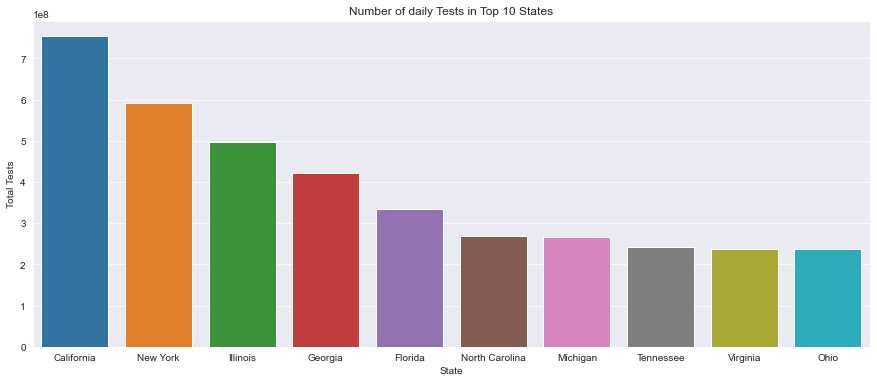

In [33]:
plt.figure(figsize=(15,6))
sns.barplot(x="State", y="Total Tests", data=test_data)
plt.title("Number of daily Tests in Top 10 States")

# Analysing the hospital_beds_ratio


In [34]:
data['hospital_beds_ratio'].describe()

count    750938.000000
mean          0.002502
std           0.004194
min           0.000000
25%           0.000529
50%           0.001627
75%           0.002962
max           0.129969
Name: hospital_beds_ratio, dtype: float64

In [35]:
hospital_bed_ratio = data.groupby('state_name')['hospital_beds_ratio'].sum()
hospital_bed_ratio = hospital_bed_ratio.sort_values(ascending=False)
most_affected_countries = hospital_bed_ratio[1:11].index

cases = hospital_bed_ratio[1:11].values 
hospital_data = pd.DataFrame({'State': most_affected_countries, 'hospital_bed_ratio': cases})
print(hospital_data)

          State  hospital_bed_ratio
0         Texas          100.970059
1   Mississippi          100.827634
2       Georgia           90.234412
3      Nebraska           79.304475
4     Minnesota           75.849900
5  South Dakota           75.274604
6      Virginia           72.350081
7       Montana           67.217476
8          Iowa           63.619707
9  North Dakota           63.062283


plt.figure(figsize=(15,6))
sns.barplot(x="State", y="hospital_bed_ratio", data=hospital_data)
plt.title("Hospital bed ratio in Top 10 states")

# Analysing the icu_beds_ratio

In [36]:
data['icu_beds_ratio'].describe()

count    750938.000000
mean          0.000282
std           0.000355
min           0.000000
25%           0.000051
50%           0.000201
75%           0.000364
max           0.006031
Name: icu_beds_ratio, dtype: float64

In [37]:
icu_bed_ratio = data.groupby('state_name')['icu_beds_ratio'].sum()
icu_bed_ratio = icu_bed_ratio.sort_values(ascending=False)
most_affected_countries = icu_bed_ratio[1:11].index

cases = icu_bed_ratio[1:11].values 
icu_data = pd.DataFrame({'State': most_affected_countries, 'icu_bed_ratio': cases})
print(icu_data)

            State  icu_bed_ratio
0          Kansas      17.344934
1        Nebraska       9.706755
2         Georgia       8.771526
3            Iowa       7.622565
4       Minnesota       7.446824
5         Montana       7.223407
6        Kentucky       6.958729
7        Oklahoma       6.802939
8  North Carolina       6.488957
9    South Dakota       6.211574


Text(0.5, 1.0, 'icu_bed_ratio in Top 10 states')

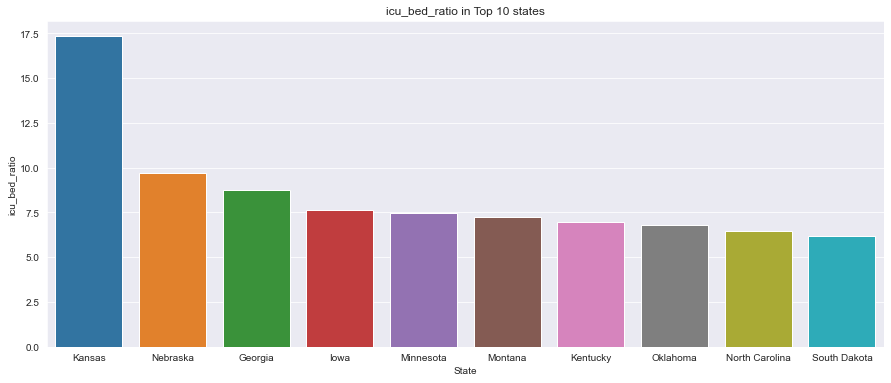

In [38]:
plt.figure(figsize=(15,6))
sns.barplot(x="State", y="icu_bed_ratio", data=icu_data)
plt.title("icu_bed_ratio in Top 10 states")

In [39]:
import folium

last_date = data['date'].unique()[-1]
last_day = data[data.date == last_date]


usa_covid_map = folium.Map(location = [41.850033, -87.6500523], zoom_start=4)

zipped_data = zip(list(last_day['state_name']),
                  list(last_day['latitude']),
                  list(last_day['longitude']),
                  list(last_day['covid_19_confirmed_cases']),
                  list(last_day['covid_19_deaths']),
                  list(last_day['area']),
                  list(last_day['total_population']))

for state_name, latitude, longitude, covid_19_confirmed_cases, covid_19_deaths, area, total_population in zipped_data:
    popup_content = ('<b>State  : '+ str(state_name) + '<br>' +
            '<b>Total Confirmed Cases : '+ str(covid_19_confirmed_cases) +'<br>' +
            '<font color=red>Total Deaths : </font>'+ str(covid_19_deaths) +'<br>' +
            '<font color=green>Total population : </font>'+ str(total_population) +'<br>')
    
    folium.CircleMarker(location = [latitude,longitude],
                       radius = 4,
                       color='red',
                       fill = True,
                       fill_color="red").add_to(usa_covid_map)
    
    folium.Marker(location = [latitude,longitude],
          popup=folium.Popup(popup_content, max_width=200)).add_to(usa_covid_map)

usa_covid_map

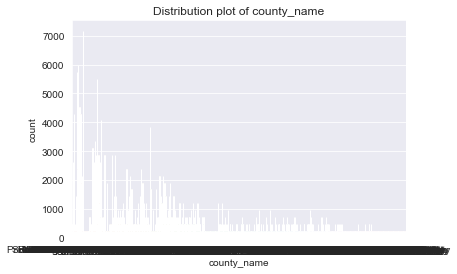

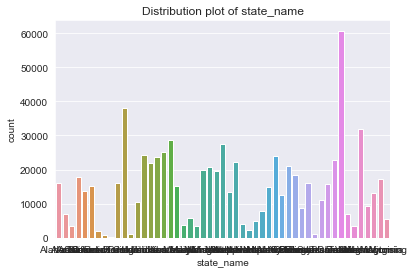

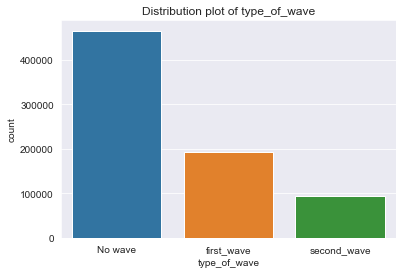

In [40]:
categorical_cols=[i for i in data.columns if data.dtypes[i]=='object']

def plot(col):
    sns.countplot(data[col])
    plt.title('Distribution plot of {}'.format(col))
    plt.show()
    
for col in categorical_cols:
    plot(col)

# Forecasting covid cases


In [41]:
corr = data.corr()

corr.style.background_gradient(cmap='coolwarm').set_precision(2)

,covid_19_confirmed_cases,covid_19_deaths,daily_state_test,total_population,female_percent,area,population_density,latitude,longitude,hospital_beds_ratio,icu_beds_ratio,houses_density,less_than_high_school_diploma,high_school_diploma_only,some_college_or_higher,total_college_population,percent_smokers,percent_diabetes,Religious_congregation_ratio,political_party,airport_distance,passenger_load_ratio,meat_plants,median_household_income,percent_insured,deaths_per_100000,gdp_per_capita,age_0_4,age_5_9,age_10_14,age_15_19,age_20_24,age_25_29,age_30_34,age_35_39,age_40_44,age_45_49,age_50_54,age_55_59,age_60_64,age_65_69,age_70_74,age_75_79,age_80_84,age_85_or_higher,immigrant_student_ratio
covid_19_confirmed_cases,1.00,0.47,0.17,0.56,0.06,0.02,0.18,-0.06,0.01,-0.01,0.03,0.16,0.01,-0.15,0.09,0.05,-0.08,-0.06,-0.01,0.01,-0.12,-0.01,0.50,0.11,0.00,-0.11,-0.00,0.06,0.04,0.02,0.03,0.06,0.13,0.13,0.12,0.08,-0.02,-0.08,-0.11,-0.11,-0.11,-0.11,-0.10,-0.07,-0.06,0.03
covid_19_deaths,0.47,1.00,0.06,0.33,0.05,0.00,0.25,-0.01,0.04,-0.00,0.02,0.23,0.01,-0.09,0.05,0.02,-0.05,-0.04,-0.00,0.03,-0.08,-0.01,0.30,0.08,0.02,-0.06,-0.00,0.02,0.01,0.01,0.01,0.03,0.08,0.08,0.07,0.06,-0.00,-0.04,-0.06,-0.06,-0.06,-0.06,-0.05,-0.03,-0.02,0.01
daily_state_test,0.17,0.06,1.00,0.14,-0.02,-0.02,0.07,-0.14,0.01,-0.05,-0.04,0.07,0.09,-0.10,0.01,0.02,-0.13,-0.03,-0.05,0.08,-0.10,-0.01,0.10,0.07,-0.04,-0.05,0.02,-0.02,-0.00,-0.00,0.04,0.05,0.06,0.03,0.06,0.08,0.00,-0.05,-0.06,-0.02,-0.02,-0.04,-0.04,-0.04,-0.06,0.01
total_population,0.56,0.33,0.14,1.00,0.12,0.03,0.33,-0.06,-0.00,-0.02,0.05,0.29,-0.05,-0.32,0.24,0.09,-0.19,-0.14,-0.05,0.07,-0.25,-0.03,0.84,0.28,0.08,-0.21,-0.00,0.08,0.06,0.03,0.05,0.12,0.25,0.25,0.23,0.18,-0.01,-0.13,-0.18,-0.19,-0.22,-0.22,-0.20,-0.14,-0.10,0.06
female_percent,0.06,0.05,-0.02,0.12,1.00,-0.14,0.09,-0.12,0.23,0.04,0.09,0.09,-0.11,-0.14,0.16,0.11,0.01,0.13,0.13,0.00,-0.22,0.01,0.10,0.03,0.10,0.17,-0.05,0.12,0.16,0.20,0.17,-0.03,-0.24,-0.25,-0.15,-0.12,-0.14,-0.08,-0.04,0.04,0.05,0.05,0.08,0.09,0.08,0.10
area,0.02,0.00,-0.02,0.03,-0.14,1.00,-0.02,0.27,-0.38,-0.01,-0.02,-0.03,-0.01,-0.02,0.02,-0.02,0.06,-0.09,-0.04,-0.02,0.21,-0.01,-0.00,0.02,-0.12,-0.11,0.00,0.12,0.07,0.07,0.05,0.02,0.05,0.02,-0.06,-0.07,-0.03,0.05,0.04,-0.03,-0.05,-0.08,-0.09,-0.10,-0.10,-0.02
population_density,0.18,0.25,0.07,0.33,0.09,-0.02,1.00,0.01,0.09,0.01,0.02,0.97,-0.01,-0.19,0.13,0.07,-0.06,-0.08,0.00,0.08,-0.15,-0.00,0.24,0.16,0.06,-0.13,0.00,0.02,-0.03,-0.06,0.00,0.11,0.25,0.22,0.15,0.09,-0.04,-0.12,-0.12,-0.12,-0.13,-0.13,-0.12,-0.08,-0.06,0.05
latitude,-0.06,-0.01,-0.14,-0.06,-0.12,0.27,0.01,1.00,-0.29,0.07,0.02,0.01,-0.51,-0.04,0.33,-0.01,-0.17,-0.30,-0.08,0.25,0.17,-0.08,-0.02,0.26,0.43,-0.13,-0.03,-0.09,-0.09,-0.07,-0.05,-0.09,-0.14,-0.16,-0.22,-0.12,0.14,0.32,0.29,0.08,-0.00,-0.02,0.05,0.13,0.26,-0.02
longitude,0.01,0.04,0.01,-0.00,0.23,-0.38,0.09,-0.29,1.00,-0.04,-0.06,0.10,0.08,0.23,-0.20,0.05,0.24,0.25,-0.06,0.03,-0.36,-0.00,0.02,-0.06,0.21,0.25,-0.02,-0.21,-0.14,-0.12,0.02,0.07,-0.05,-0.00,0.20,0.30,0.16,-0.03,-0.14,-0.00,0.01,0.00,-0.00,-0.01,-0.02,0.06
hospital_beds_ratio,-0.01,-0.00,-0.05,-0.02,0.04,-0.01,0.01,0.07,-0.04,1.00,0.53,0.01,-0.03,-0.04,0.05,0.02,-0.01,-0.03,0.16,0.03,0.16,-0.04,-0.02,-0.09,-0.02,0.13,-0.01,-0.02,-0.06,-0.08,-0.03,-0.01,0.01,-0.08,-0.15,-0.20,-0.09,0.04,0.05,-0.02,-0.02,0.08,0.16,0.19,0.26,0.01


In [42]:
data.head()

,date,county_name,state_name,covid_19_confirmed_cases,covid_19_deaths,daily_state_test,total_population,female_percent,area,population_density,...,age_50_54,age_55_59,age_60_64,age_65_69,age_70_74,age_75_79,age_80_84,age_85_or_higher,immigrant_student_ratio,type_of_wave
0,2020-01-22,Autauga County,Alabama,0.0,0.0,0.0,55601,0.514487,594.44,93.535092,...,7,6,5,4,3,2,1,1,0.0,No wave
1,2020-01-23,Autauga County,Alabama,0.0,0.0,0.0,55601,0.514487,594.44,93.535092,...,7,6,5,4,3,2,1,1,0.0,No wave
2,2020-01-24,Autauga County,Alabama,0.0,0.0,0.0,55601,0.514487,594.44,93.535092,...,7,6,5,4,3,2,1,1,0.0,No wave
3,2020-01-25,Autauga County,Alabama,0.0,0.0,0.0,55601,0.514487,594.44,93.535092,...,7,6,5,4,3,2,1,1,0.0,No wave
4,2020-01-26,Autauga County,Alabama,0.0,0.0,0.0,55601,0.514487,594.44,93.535092,...,7,6,5,4,3,2,1,1,0.0,No wave


In [43]:
data = data.loc[data['state_name'].isin(['Texas'])]

In [44]:
data.tail()

,date,county_name,state_name,covid_19_confirmed_cases,covid_19_deaths,daily_state_test,total_population,female_percent,area,population_density,...,age_50_54,age_55_59,age_60_64,age_65_69,age_70_74,age_75_79,age_80_84,age_85_or_higher,immigrant_student_ratio,type_of_wave
663698,2020-09-12,Zavala County,Texas,7.0,0.0,65600.0,11983,0.4942,1297.41,9.236093,...,6,6,5,4,3,2,2,1,0.0,No wave
663699,2020-09-13,Zavala County,Texas,0.0,0.0,30498.0,11983,0.4942,1297.41,9.236093,...,6,6,5,4,3,2,2,1,0.0,No wave
663700,2020-09-14,Zavala County,Texas,0.0,0.0,-336892.0,11983,0.4942,1297.41,9.236093,...,6,6,5,4,3,2,2,1,0.0,No wave
663701,2020-09-15,Zavala County,Texas,1.0,1.0,34295.0,11983,0.4942,1297.41,9.236093,...,6,6,5,4,3,2,2,1,0.0,No wave
663702,2020-09-16,Zavala County,Texas,0.0,0.0,52078.0,11983,0.4942,1297.41,9.236093,...,6,6,5,4,3,2,2,1,0.0,No wave


In [45]:
# Encode all the categorical columns
for col_name in data.columns:
    if(data[col_name].dtype == 'object'):
        data[col_name]= data[col_name].astype('category')
        data[col_name] = data[col_name].cat.codes

In [46]:
dataset= data.copy()

In [47]:
training=(data['date'] >= '2020-01-22') & (data['date'] <= '2020-08-15')
train = data.loc[training]

train.head()

,date,county_name,state_name,covid_19_confirmed_cases,covid_19_deaths,daily_state_test,total_population,female_percent,area,population_density,...,age_50_54,age_55_59,age_60_64,age_65_69,age_70_74,age_75_79,age_80_84,age_85_or_higher,immigrant_student_ratio,type_of_wave
602997,2020-01-22,0,0,0.0,0.0,0.0,58057,0.38774,1062.6,54.63674,...,8,6,5,4,3,2,2,1,0.0,0
602998,2020-01-23,0,0,0.0,0.0,0.0,58057,0.38774,1062.6,54.63674,...,8,6,5,4,3,2,2,1,0.0,0
602999,2020-01-24,0,0,0.0,0.0,0.0,58057,0.38774,1062.6,54.63674,...,8,6,5,4,3,2,2,1,0.0,0
603000,2020-01-25,0,0,0.0,0.0,0.0,58057,0.38774,1062.6,54.63674,...,8,6,5,4,3,2,2,1,0.0,0
603001,2020-01-26,0,0,0.0,0.0,0.0,58057,0.38774,1062.6,54.63674,...,8,6,5,4,3,2,2,1,0.0,0


In [48]:
testing=(data['date'] >= '2020-08-16') & (data['date'] <= '2020-09-16')
test = data.loc[testing]


In [49]:
test.head()

,date,county_name,state_name,covid_19_confirmed_cases,covid_19_deaths,daily_state_test,total_population,female_percent,area,population_density,...,age_50_54,age_55_59,age_60_64,age_65_69,age_70_74,age_75_79,age_80_84,age_85_or_higher,immigrant_student_ratio,type_of_wave
603204,2020-08-16,0,0,0.0,1.0,117365.0,58057,0.38774,1062.6,54.63674,...,8,6,5,4,3,2,2,1,0.0,0
603205,2020-08-17,0,0,0.0,0.0,37126.0,58057,0.38774,1062.6,54.63674,...,8,6,5,4,3,2,2,1,0.0,0
603206,2020-08-18,0,0,0.0,0.0,24478.0,58057,0.38774,1062.6,54.63674,...,8,6,5,4,3,2,2,1,0.0,0
603207,2020-08-19,0,0,0.0,0.0,16544.0,58057,0.38774,1062.6,54.63674,...,8,6,5,4,3,2,2,1,0.0,0
603208,2020-08-20,0,0,0.0,0.0,29880.0,58057,0.38774,1062.6,54.63674,...,8,6,5,4,3,2,2,1,0.0,0


In [50]:
import plotly.graph_objects as go
fig = go.Figure()
fig.add_trace(go.Scatter(x=train.date, y=train.covid_19_confirmed_cases, name='Training'))
fig.add_trace(go.Scatter(x=test.date,  y=test.covid_19_confirmed_cases,  name='Test'))
fig.show()

In [51]:
train=train.drop(['date'], axis = 1)
test=test.drop(['date'], axis = 1)

# Forecasting covid cases using Linear regression

In [52]:
features = train.iloc[:,5:]

target= train['covid_19_confirmed_cases'] 

In [53]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=.2)

In [54]:
from sklearn.linear_model import LinearRegression 
linear = LinearRegression().fit(X_train,y_train)

In [55]:
linear.coef_

array([ 8.30908915e-05, -2.94370540e+01, -1.79592285e-04, -2.75893538e-02,
       -1.05704055e+00, -1.19695861e-01, -1.76759063e+02,  2.29224182e+03,
        9.69455346e-02,  9.00596196e+00,  9.30810662e+00,  9.17145282e+00,
        1.18956382e+00, -3.30449397e-01, -5.60585549e-02, -1.17473141e-02,
        2.13808556e-06, -1.36839329e-02, -5.26169824e-02,  2.50452541e-01,
       -2.50150899e-04, -5.11528082e-01, -1.18568049e-03,  1.87792974e-04,
       -6.66690289e-01, -9.98552845e-02,  3.16840050e-01, -9.90011467e-02,
       -8.56111708e-01,  1.01405452e-01, -1.08466731e+00,  2.05113065e-01,
       -1.17076035e+00, -3.07315011e-01, -1.14594208e+00, -3.37431282e-02,
        2.04856054e-01, -1.42196111e+00, -1.02419179e+00, -1.06267028e-01,
        4.51468964e-01, -9.59383592e-01, -1.88715488e+01, -3.11515597e+00])

In [56]:
pd.DataFrame(linear.coef_, 
             X_train.columns, 
             columns=['coef'])\
            .sort_values(by='coef', ascending=False)

,coef
icu_beds_ratio,2292.241818
high_school_diploma_only,9.308107
some_college_or_higher,9.171453
less_than_high_school_diploma,9.005962
total_college_population,1.189564
age_80_84,0.451469
age_10_14,0.316840
meat_plants,0.250453
age_35_39,0.205113
age_60_64,0.204856


In [57]:
pred = linear.predict(X_test)

In [58]:
pred.shape

(10516,)

In [59]:
y_test.shape

(10516,)

In [60]:
df = pd.DataFrame({'Actual': y_test, 'Predicted': pred})
df

,Actual,Predicted
637034,1.0,0.334152
645427,2.0,42.587750
612756,0.0,-1.531267
628474,6.0,3.212918
656782,0.0,10.378579
...,...,...
614352,0.0,2.950395
616869,0.0,5.890718
610966,0.0,-2.481442
639812,0.0,27.180639


In [61]:
df_pred=pd.melt(df, value_vars=['Actual','Predicted'])

import plotly.express as px 
fig = px.line(df_pred, y='value', color='variable',title="Result of Linear regression")

# Show plot 
fig.show()

In [62]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, pred)))

Mean Absolute Error: 13.616850499079948
Mean Squared Error: 3153.751763253043
Root Mean Squared Error: 56.158274218970114


# Random forest regresssion

In [63]:
from sklearn.ensemble import RandomForestRegressor

model = RandomForestRegressor(oob_score = True,n_jobs =3,random_state =7,
                              max_features = "auto", min_samples_leaf =4)

model.fit(X_train,y_train)

RandomForestRegressor(min_samples_leaf=4, n_jobs=3, oob_score=True,
                      random_state=7)

In [64]:
pred2=model.predict(X_test)

df = pd.DataFrame({'Actual': y_test, 'Predicted': pred2})
df

,Actual,Predicted
637034,1.0,0.109663
645427,2.0,89.344822
612756,0.0,0.378190
628474,6.0,2.253592
656782,0.0,9.995600
...,...,...
614352,0.0,0.212175
616869,0.0,4.339329
610966,0.0,0.241118
639812,0.0,42.266398


In [65]:
df_pred=pd.melt(df, value_vars=['Actual','Predicted'])

import plotly.express as px 
fig = px.line(df_pred, y='value', color='variable',title="Result of Random forest regression")

# Show plot 
fig.show()

# Arima model

In [66]:
val = data['covid_19_confirmed_cases'].values

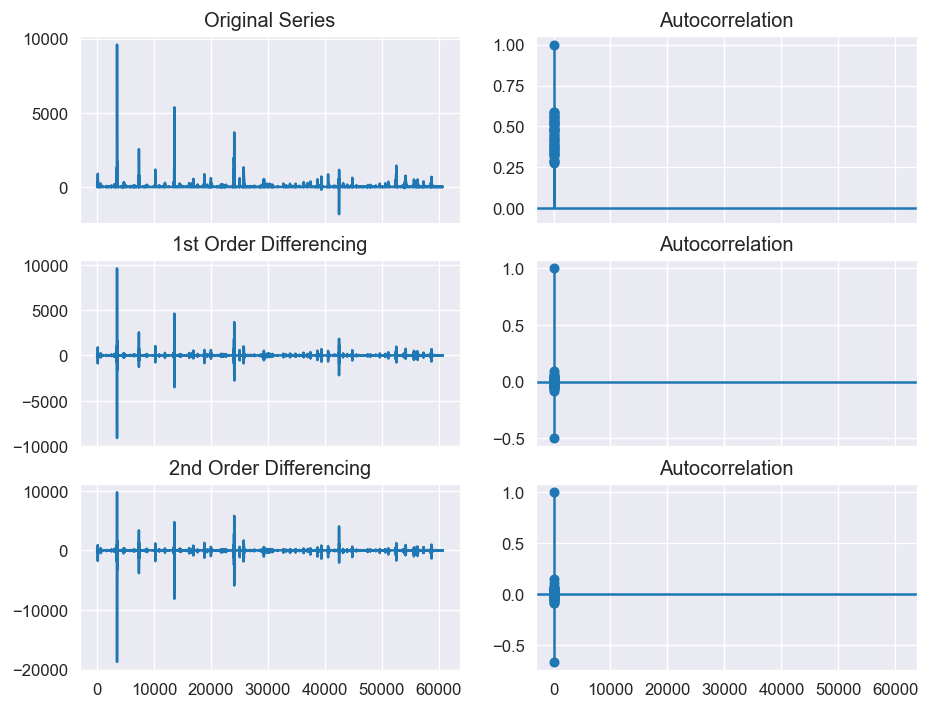

In [67]:
import numpy as np
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt
plt.rcParams.update({'figure.figsize':(9,7), 'figure.dpi':120})

# Original Series
fig, axes = plt.subplots(3, 2, sharex=True)
axes[0, 0].plot(val); axes[0, 0].set_title('Original Series')
plot_acf(val, ax=axes[0, 1])

# 1st Differencing
axes[1, 0].plot(np.diff(val)); axes[1, 0].set_title('1st Order Differencing')
plot_acf(np.diff(val), ax=axes[1, 1])
diffval = np.diff(val)

# 2nd Differencing
axes[2, 0].plot(np.diff(diffval)); axes[2, 0].set_title('2nd Order Differencing')
plot_acf(np.diff(diffval), ax=axes[2, 1])
plt.show()

In [68]:
#!pip install pmdarima

In [69]:
from statsmodels.tsa.arima_model import ARIMA
import pmdarima as pm
model = pm.auto_arima(val, start_p=1, start_q=1,
test='adf', # use adftest to find optimal 'd'
max_p=3, max_q=3, # maximum p and q
m=1, # frequency of series
d=None, # let model determine 'd'
seasonal=False, # No Seasonality
start_P=0,
D=0,
trace=True,
error_action='ignore',
suppress_warnings=True,
stepwise=True)
print(model.summary())

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=668425.417, Time=12.92 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=713852.480, Time=0.70 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=687443.323, Time=0.97 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=699088.823, Time=6.32 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=668425.782, Time=23.64 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=668425.830, Time=13.77 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=692152.038, Time=17.86 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=678383.619, Time=1.50 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=668368.607, Time=24.32 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=668316.600, Time=34.87 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=668418.388, Time=22.60 sec
 ARIMA(3,0,3)(0,0,0)[0]             : AIC=668203.312, Time=60.55 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=668324.291, Time=32.40 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=668319.809, Time=186.4

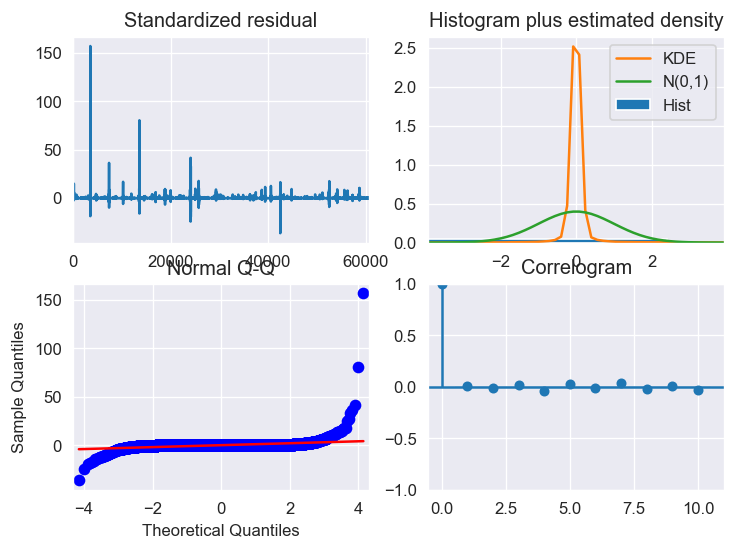

In [70]:
model.plot_diagnostics(figsize=(7,5))
plt.show()

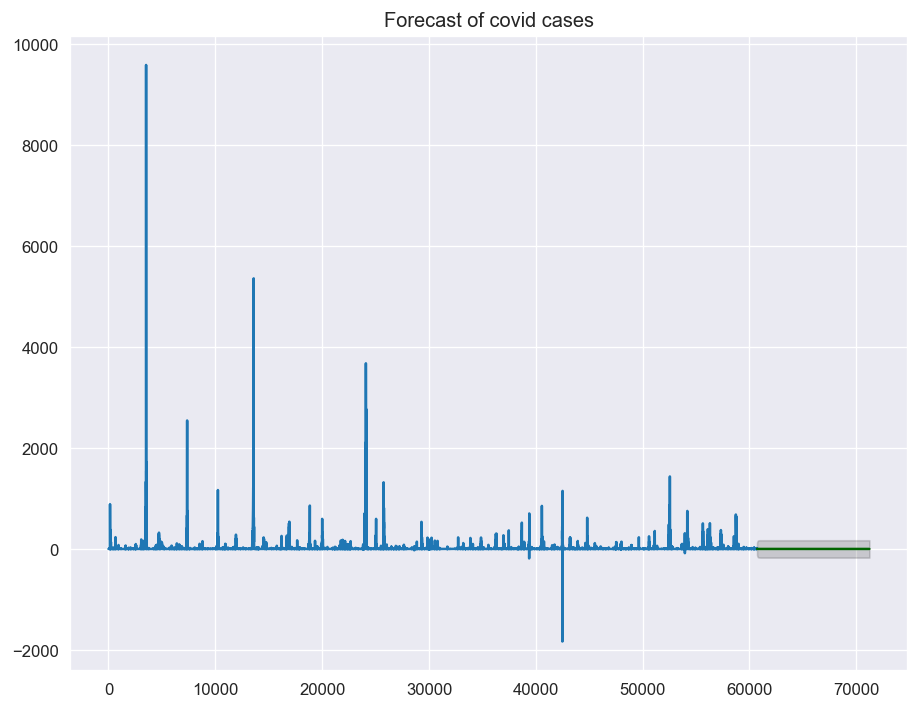

In [72]:
# Forecast
n_periods = 10516
fc, confint = model.predict(n_periods=n_periods, return_conf_int=True)
index_of_fc = np.arange(len(val), len(val)+n_periods)

# make series for plotting purpose
fc_series = pd.Series(fc, index=index_of_fc)
lower_series = pd.Series(confint[:, 0], index=index_of_fc)
upper_series = pd.Series(confint[:, 1], index=index_of_fc)

# Plot
plt.plot(val)
plt.plot(fc_series, color='darkgreen')
plt.fill_between(lower_series.index,
lower_series,
upper_series,
color='k', alpha=.15)
plt.title("Forecast of covid cases")
plt.show()

In [71]:
def forecast_accuracy(forecast, actual):
    mae = np.mean(np.abs(forecast - actual))    # MAE
    rmse = np.mean((forecast - actual)**2)**.5  # RMSE
    mse= np.mean((forecast - actual)**2)
    return({'mae': mae, 'rmse':rmse,
            'mse':mse})

forecast_accuracy(fc, index_of_fc)

NameError: name 'fc' is not defined